# Import all the required libraries

In [ ]:
!pip install networkx

In [43]:
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By
from selenium.webdriver.support.wait import WebDriverWait
import time
import re
import pandas as pd
import networkx as nx
import igraph as ig
from igraph import *
import matplotlib.pyplot as plt
import networkx.algorithms.community as nxcom

# Run ChromeDriver to open Chrome

In [44]:
driver_loc="C:/Users/karth/Desktop/chromedriver"
driver = webdriver.Chrome(driver_loc)
driver.get("https://www.instagram.com")

# Enter Username and Password

In [45]:
#target username
username = WebDriverWait(driver, 10).until(EC.element_to_be_clickable((By.CSS_SELECTOR, "input[name='username']")))
password = WebDriverWait(driver, 10).until(EC.element_to_be_clickable((By.CSS_SELECTOR, "input[name='password']")))
username.clear()
username.send_keys("karthik.anand5@hotmail.com")
password.clear()
password.send_keys("dummyacc")

#target the login button and click it
button = WebDriverWait(driver, 2).until(EC.element_to_be_clickable((By.CSS_SELECTOR, "button[type='submit']"))).click()

time.sleep(5)

# To bypass the security options and the option to turn on notifications

In [46]:
alert = WebDriverWait(driver, 15).until(EC.element_to_be_clickable((By.XPATH, '//button[contains(text(), "Not Now")]'))).click()
alert2 = WebDriverWait(driver, 15).until(EC.element_to_be_clickable((By.XPATH, '//button[contains(text(), "Not Now")]'))).click()

# Search for the hashtag

In [47]:
searchbox = WebDriverWait(driver, 10).until(EC.element_to_be_clickable((By.XPATH, "//input[@placeholder='Search']")))
searchbox.clear()

#search for the hashtag cat
keyword = "#travel"
searchbox.send_keys(keyword)

time.sleep(5) # Wait for 5 seconds
my_link = WebDriverWait(driver, 10).until(EC.element_to_be_clickable((By.XPATH, "//a[contains(@href, '/" + keyword[1:] + "/')]")))
my_link.click()

# Specify the number of scrolls so as to modulate the number of posts

In [48]:
n_scrolls = 3
for j in range(0, n_scrolls):
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    time.sleep(3)

# Pick out all the links of the images on the page

In [49]:
anchors = driver.find_elements_by_tag_name('a')
anchors = [a.get_attribute('href') for a in anchors]
#narrow down all links to image links only
anchors = [a for a in anchors if str(a).startswith("https://www.instagram.com/p/")]

print('Found ' + str(len(anchors)) + ' links to images')
anchors

Found 81 links to images


['https://www.instagram.com/p/CNu2g7kpqyQ/',
 'https://www.instagram.com/p/CNu59h4B7Jk/',
 'https://www.instagram.com/p/CNu7ANQsbgz/',
 'https://www.instagram.com/p/CNu4rEorxFT/',
 'https://www.instagram.com/p/CNu5epbhJAt/',
 'https://www.instagram.com/p/CNu3277g6_W/',
 'https://www.instagram.com/p/CNu3cExspFs/',
 'https://www.instagram.com/p/CNu7REFDeCW/',
 'https://www.instagram.com/p/CNu6heDl1jz/',
 'https://www.instagram.com/p/CNu5oFjpwiJ/',
 'https://www.instagram.com/p/CNu216Xn3Yt/',
 'https://www.instagram.com/p/CNu8Fl6BgFw/',
 'https://www.instagram.com/p/CNu04AcgRdJ/',
 'https://www.instagram.com/p/CNu3wkosaZP/',
 'https://www.instagram.com/p/CNu4r17lgHV/',
 'https://www.instagram.com/p/CNu6C50qnOU/',
 'https://www.instagram.com/p/CNu6D9mBmV3/',
 'https://www.instagram.com/p/CNu47ZlBmO_/',
 'https://www.instagram.com/p/CNu51mBM5wj/',
 'https://www.instagram.com/p/CNu5wB5BPWc/',
 'https://www.instagram.com/p/CNu2iaoMshP/',
 'https://www.instagram.com/p/CNu5YyYBt73/',
 'https://

# Click on each link stored in the list, and get all the elements with a specific class name. These elements are the hashtags corresponding to the post.

# As we append the hashtags to a list, we remove any emojis, capital letters etc. so as to remove any ambiguity. 

In [50]:
images = []
d={}
counter=0
import io
import codecs
file=codecs.open("Hashtags.txt","w","utf-8") #my file is output_log + the date time stamp
#follow each image link and extract only image at index=1
for a in anchors:
    driver.get(a)
    time.sleep(5)
    img = driver.find_elements_by_class_name('xil3i')
    #img = [img.get_attribute('text') for image in img]
    #print(img)
    lst=[]
    for i in img:
        temp=i.get_attribute('text')
        temp=temp.lower()
        temp = re.sub(r'\W+', '', temp)
        #file.write(str(temp[1:])+',')
        lst.append(str(temp))
        #print(temp)
    d[counter]=lst
        #print(lst)
        
    counter=counter+1

file.close()

In [51]:
d

{0: ['wu_greece', 'wu_greece21'],
 1: ['mer',
  'sea',
  'plage',
  'nature',
  'france',
  'bretagne',
  'photographie',
  'vacances',
  'plage',
  'soleil',
  'ocean',
  'paysage',
  'landscape',
  'sun',
  'travel',
  'photo',
  'summer',
  'sunset',
  'picoftheday',
  'love',
  'photooftheday',
  'naturephotography',
  'normandie',
  'voyage',
  'bateau',
  'holidays',
  'bhfyp'],
 2: ['living_destinations',
  'yemen',
  'tree',
  'trees',
  'nature',
  'nature_shooters',
  'naturelovers',
  'mideast_vacations',
  'mideast',
  'sunset',
  'sunsetlover',
  'naturephotography',
  'nature_perfection',
  'travel',
  'traveladdict',
  'travelphotography',
  'postcardsfromtheworld',
  'bbctravel',
  'awesomeplaces',
  'wonderful_places',
  'beautifuldestinations'],
 3: ['church',
  'basilica',
  'cathedral',
  'italy',
  'rome',
  'roma',
  'florencecathedral',
  'florence',
  'explore',
  'explorepage',
  'uk',
  'archaeology',
  'history',
  'ancient',
  'art',
  'world',
  'traveling'

# Since the tags are stored in a dictionary, to extract info and visualize them, we build a DataFrame

In [52]:
df = pd.DataFrame.from_dict(d, orient ='index')

In [53]:
df

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,wu_greece,wu_greece21,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,mer,sea,plage,nature,france,bretagne,photographie,vacances,plage,soleil,...,None,None,None,None,None,None,None,None,None,None
2,living_destinations,yemen,tree,trees,nature,nature_shooters,naturelovers,mideast_vacations,mideast,sunset,...,None,None,None,None,None,None,None,None,None,None
3,church,basilica,cathedral,italy,rome,roma,florencecathedral,florence,explore,explorepage,...,travelphotography,book,tartarianempire,None,None,None,None,None,None,None
4,lagodibraies,dolomites4you,dolomites,dolomiti,dolomitiunesco,italy,visititaly,dolomitesmountain,italygram,italyphoto,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,vayju,soyvayju,tulua,tulua,findesemana,bugavalle,ecoparque,vacaciones,piscina,deportesextremos,...,bugalagrande,nature,valledelcauca,santiagodecali,None,None,None,None,None,None
77,brasil,brazil,love,instagood,photography,riodejaneiro,tbt,photooftheday,moda,travel,...,praia,beautiful,boanoite,None,None,None,None,None,None,None
78,instagood,instadaily,instagram,instagram,instalike,instamood,insta,instapic,instaphoto,igers,...,wanderlust,nyc,travel,bucketlist,None,None,None,None,None,None
79,travel,nature,photography,instadaily,love,ootd,fashion,l4l,friends,style,...,fitness,cat,instagood,None,None,None,None,None,None,None


# Save the DataFrame for future use

In [54]:
df.to_csv('final_hashtags.csv')

# Print the top 5 lines of the DataFrame to check if the tags were imported correctly

In [55]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,wu_greece,wu_greece21,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,mer,sea,plage,nature,france,bretagne,photographie,vacances,plage,soleil,...,None,None,None,None,None,None,None,None,None,None
2,living_destinations,yemen,tree,trees,nature,nature_shooters,naturelovers,mideast_vacations,mideast,sunset,...,None,None,None,None,None,None,None,None,None,None
3,church,basilica,cathedral,italy,rome,roma,florencecathedral,florence,explore,explorepage,...,travelphotography,book,tartarianempire,None,None,None,None,None,None,None
4,lagodibraies,dolomites4you,dolomites,dolomiti,dolomitiunesco,italy,visititaly,dolomitesmountain,italygram,italyphoto,...,None,None,None,None,None,None,None,None,None,None


# Make alterations by dropping the first column (optional only if you are importing CSV

In [5]:
df.drop(df.columns[0], axis=1)

,0,1,2,3,4,5,6,7,8,9,...,59,60,61,62,63,64,65,66,67,68
0,holiday,summer,vibe,chill,chillin,summervibes,summertime,travel,travelgram,pool,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,wien,loves_austria,austria,vienna,roam,österreich,nature,mountains,visitaustria,hiking,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,trecimedilavaredo,dolomites4you,dolomites,dolomiti,dolomitiunesco,italy,visititaly,dolomitesmountain,italygram,italyphoto,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,thesephotovibes,instagram,travel,explore,nature,landscape,naturephotography,landscapephotography,wanderlust,photooftheday,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,archdose,itatiba,saopaulo,architecture,arquitectura,arquitetura,design,interiordesign,art,photography,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,indiana,in,hoosier,travel,vacation,photography,optoutside,wanderlust,nomadlife,ig_color,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,californialove,california,centralvalley,losangeles,usa,norcal,rollinghills,hills,love,sandiego,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,jamaica,dancehall,reggae,caribbean,music,kingston,jamaican,reggaemusic,love,dancehallmusic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
82,realestate,italy,home,luxury,architecture,immobiliare,business,design,realestateagent,italia,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df.drop(0, axis=0)

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,59,60,61,62,63,64,65,66,67,68
1,1,wien,loves_austria,austria,vienna,roam,österreich,nature,mountains,visitaustria,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,trecimedilavaredo,dolomites4you,dolomites,dolomiti,dolomitiunesco,italy,visititaly,dolomitesmountain,italygram,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,thesephotovibes,instagram,travel,explore,nature,landscape,naturephotography,landscapephotography,wanderlust,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,archdose,itatiba,saopaulo,architecture,arquitectura,arquitetura,design,interiordesign,art,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,incredible_europe,bestcitybreaks,europe_gallery,europe_vacations,europe,city,travel,reflection,citiesoftheworld,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,79,indiana,in,hoosier,travel,vacation,photography,optoutside,wanderlust,nomadlife,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,80,californialove,california,centralvalley,losangeles,usa,norcal,rollinghills,hills,love,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,81,jamaica,dancehall,reggae,caribbean,music,kingston,jamaican,reggaemusic,love,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
82,82,realestate,italy,home,luxury,architecture,immobiliare,business,design,realestateagent,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df.drop(df.columns[0], axis=1)

,0,1,2,3,4,5,6,7,8,9,...,59,60,61,62,63,64,65,66,67,68
0,holiday,summer,vibe,chill,chillin,summervibes,summertime,travel,travelgram,pool,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,wien,loves_austria,austria,vienna,roam,österreich,nature,mountains,visitaustria,hiking,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,trecimedilavaredo,dolomites4you,dolomites,dolomiti,dolomitiunesco,italy,visititaly,dolomitesmountain,italygram,italyphoto,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,thesephotovibes,instagram,travel,explore,nature,landscape,naturephotography,landscapephotography,wanderlust,photooftheday,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,archdose,itatiba,saopaulo,architecture,arquitectura,arquitetura,design,interiordesign,art,photography,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,indiana,in,hoosier,travel,vacation,photography,optoutside,wanderlust,nomadlife,ig_color,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80,californialove,california,centralvalley,losangeles,usa,norcal,rollinghills,hills,love,sandiego,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,jamaica,dancehall,reggae,caribbean,music,kingston,jamaican,reggaemusic,love,dancehallmusic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
82,realestate,italy,home,luxury,architecture,immobiliare,business,design,realestateagent,italia,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Store the tags in a dataframe with row number as post number

In [56]:
for key in d:
    lst=d[key]
    lol=' '.join(lst)
    d[key]= lol

In [57]:
d

{0: 'wu_greece wu_greece21',
 1: 'mer sea plage nature france bretagne photographie vacances plage soleil ocean paysage landscape sun travel photo summer sunset picoftheday love photooftheday naturephotography normandie voyage bateau holidays bhfyp',
 2: 'living_destinations yemen tree trees nature nature_shooters naturelovers mideast_vacations mideast sunset sunsetlover naturephotography nature_perfection travel traveladdict travelphotography postcardsfromtheworld bbctravel awesomeplaces wonderful_places beautifuldestinations',
 3: 'church basilica cathedral italy rome roma florencecathedral florence explore explorepage uk archaeology history ancient art world traveling discovery ancienthistory travel archaeological historic london paris photography usa vacation travelphotography book tartarianempire',
 4: 'lagodibraies dolomites4you dolomites dolomiti dolomitiunesco italy visititaly dolomitesmountain italygram italyphoto southtyrol italytrip sudtirol dolomiten dolomitesworld wanderlu

In [58]:
df = pd.DataFrame.from_dict(d,columns=['tags'], orient ='index')

In [59]:
df

,tags
0,wu_greece wu_greece21
1,mer sea plage nature france bretagne photograp...
2,living_destinations yemen tree trees nature na...
3,church basilica cathedral italy rome roma flor...
4,lagodibraies dolomites4you dolomites dolomiti ...
...,...
76,vayju soyvayju tulua tulua findesemana bugaval...
77,brasil brazil love instagood photography riode...
78,instagood instadaily instagram instagram insta...
79,travel nature photography instadaily love ootd...


# Make a list of all the tags to calculate frequency of each tag

In [60]:
newlst = []
for i in range(0,len(df)):
    lst = []
    lst = df.loc[i]
    lst = lst[0].split()
    for item in lst:
        item = item.lower()
        stripped_string = re.sub(r'\W+', '', item)
        newlst.append(stripped_string)

In [61]:
print(newlst)

['wu_greece', 'wu_greece21', 'mer', 'sea', 'plage', 'nature', 'france', 'bretagne', 'photographie', 'vacances', 'plage', 'soleil', 'ocean', 'paysage', 'landscape', 'sun', 'travel', 'photo', 'summer', 'sunset', 'picoftheday', 'love', 'photooftheday', 'naturephotography', 'normandie', 'voyage', 'bateau', 'holidays', 'bhfyp', 'living_destinations', 'yemen', 'tree', 'trees', 'nature', 'nature_shooters', 'naturelovers', 'mideast_vacations', 'mideast', 'sunset', 'sunsetlover', 'naturephotography', 'nature_perfection', 'travel', 'traveladdict', 'travelphotography', 'postcardsfromtheworld', 'bbctravel', 'awesomeplaces', 'wonderful_places', 'beautifuldestinations', 'church', 'basilica', 'cathedral', 'italy', 'rome', 'roma', 'florencecathedral', 'florence', 'explore', 'explorepage', 'uk', 'archaeology', 'history', 'ancient', 'art', 'world', 'traveling', 'discovery', 'ancienthistory', 'travel', 'archaeological', 'historic', 'london', 'paris', 'photography', 'usa', 'vacation', 'travelphotography',

In [62]:
freq = {}
for items in newlst:
        freq[items] = newlst.count(items)

In [63]:
print(freq)

{'wu_greece': 3, 'wu_greece21': 1, 'mer': 1, 'sea': 4, 'plage': 2, 'nature': 25, 'france': 4, 'bretagne': 1, 'photographie': 1, 'vacances': 1, 'soleil': 1, 'ocean': 3, 'paysage': 1, 'landscape': 11, 'sun': 3, 'travel': 76, 'photo': 16, 'summer': 8, 'sunset': 8, 'picoftheday': 21, 'love': 25, 'photooftheday': 25, 'naturephotography': 9, 'normandie': 1, 'voyage': 1, 'bateau': 1, 'holidays': 2, 'bhfyp': 9, 'living_destinations': 2, 'yemen': 1, 'tree': 2, 'trees': 2, 'nature_shooters': 1, 'naturelovers': 4, 'mideast_vacations': 1, 'mideast': 1, 'sunsetlover': 1, 'nature_perfection': 3, 'traveladdict': 6, 'travelphotography': 28, 'postcardsfromtheworld': 1, 'bbctravel': 3, 'awesomeplaces': 1, 'wonderful_places': 2, 'beautifuldestinations': 11, 'church': 1, 'basilica': 1, 'cathedral': 1, 'italy': 7, 'rome': 1, 'roma': 1, 'florencecathedral': 1, 'florence': 2, 'explore': 12, 'explorepage': 7, 'uk': 1, 'archaeology': 1, 'history': 2, 'ancient': 2, 'art': 16, 'world': 3, 'traveling': 9, 'discov

# Initalize G_symmetric as a Graph from networkx

In [64]:
G_symmetric = nx.Graph()

In [65]:
lst=d[0].split(' ')

In [66]:
lst

['wu_greece', 'wu_greece21']

In [ ]:
for key in d:
    lst=d[key].split(' ')
    for i in range(len(lst)-1):
        G_symmetric.add_edges(lst[i],lst[i+1])       

# Add edges to the graph by iterating through the dicitonary, by putting each set into a list and adding edges

0.08988322765679696


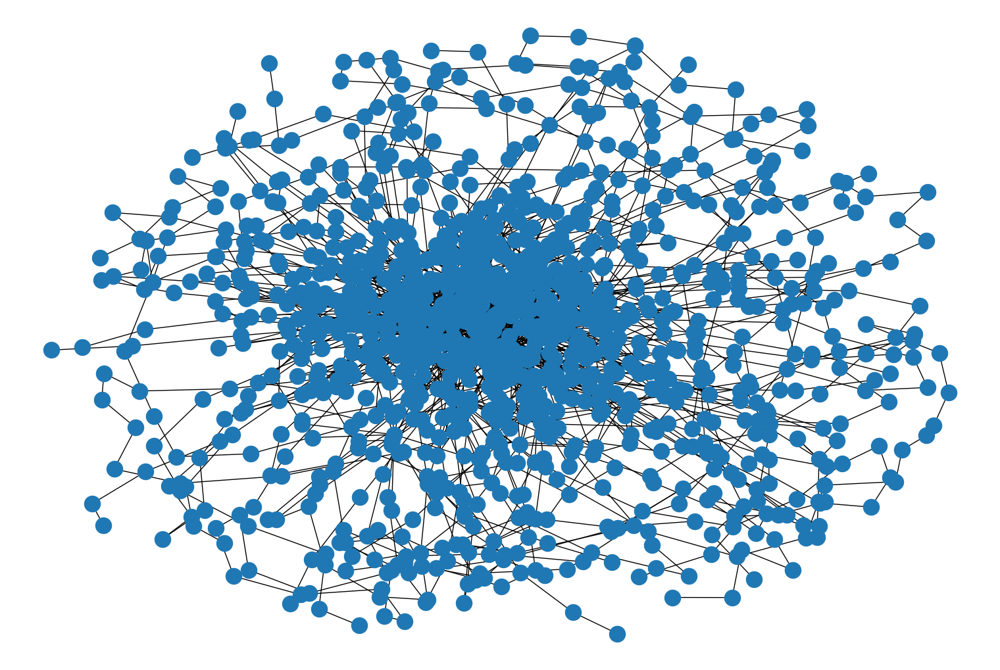

In [67]:
import math
for key in d:
    lst=d[key].split(' ')
    for i in range(len(lst)-1):
        G_symmetric.add_edge(lst[i],lst[i+1])

k=3/math.sqrt(G_symmetric.order())
print(k)
pos = nx.spring_layout(G_symmetric,k)
nx.draw(G_symmetric, pos)
plt.show()

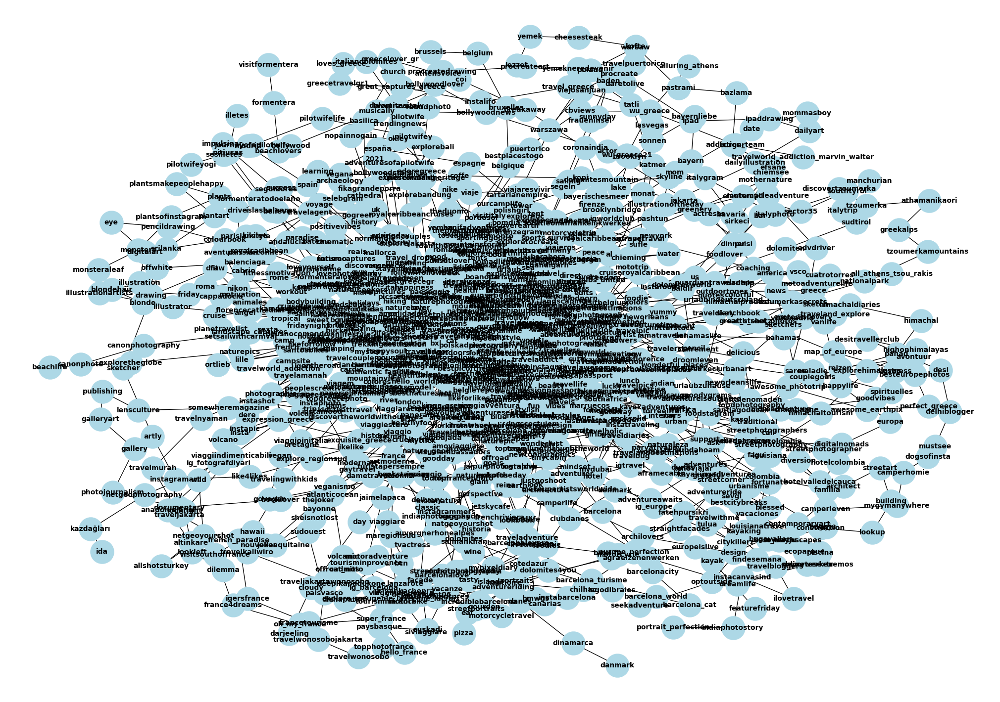

In [68]:
plt.figure(figsize=(20,14))
nx.draw(G_symmetric, pos = pos, \
    node_size=1200, node_color='lightblue', linewidths=0.25, \
    font_size=10, font_weight='bold', with_labels=True)

plt.show()    


0.08984291223532197


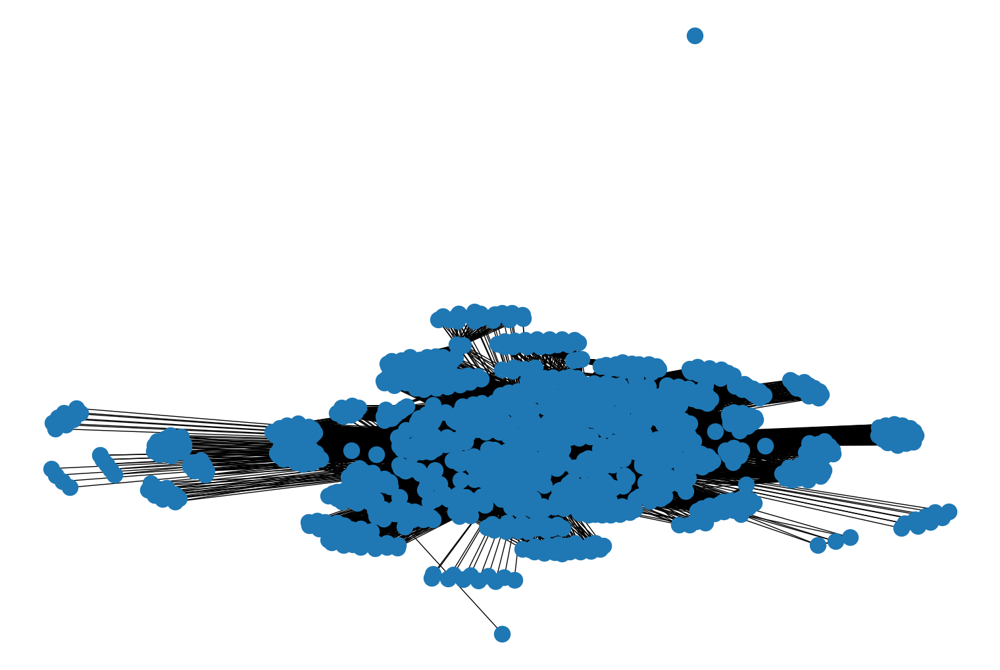

In [69]:
for key in d:
    lst=d[key].split(' ')
    for i in range(len(lst)):
        lst[i]=lst[i].lower()
        for j in range(len(lst)):
            lst[j]=lst[j].lower()
            G_symmetric.add_edge(lst[i],lst[j])

k=3/math.sqrt(G_symmetric.order())
print(k)
pos = nx.spring_layout(G_symmetric,k)
nx.draw(G_symmetric, pos)
plt.show()

0.08984291223532197


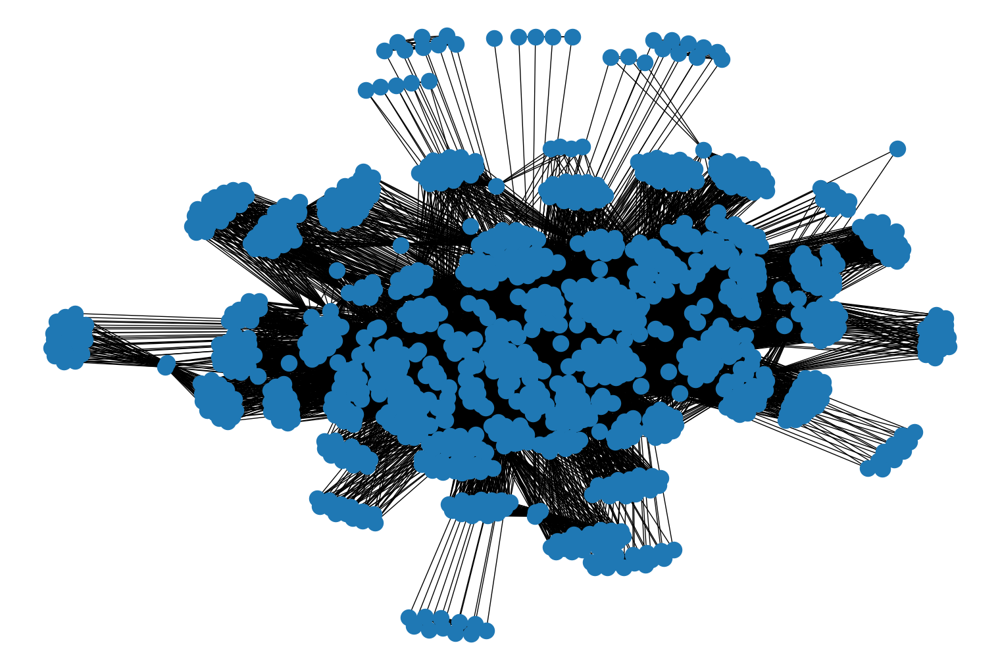

In [70]:
for key in d:
    lst=d[key].split(' ')
    l=lst[:5]
    l.append("travel")
    for i in range(len(l)):
        for j in range(len(l)):
            G_symmetric.add_edge(l[i],l[j])

k=3/math.sqrt(G_symmetric.order())
print(k)
pos = nx.spring_layout(G_symmetric,k)
nx.draw(G_symmetric, pos)
plt.show()

# Calculating all the centralities of the graph

In [73]:
dc=nx.degree_centrality(G_symmetric) 
centralities = pd.DataFrame.from_dict(dc,columns=['DegreeCentrality'], orient ='index')
centralities.sort_values(by=['DegreeCentrality'], inplace=True, ascending=False)
print(centralities)
# TODO: SORT THE DICTIONARY SO WE CAN SHOW THE NODE WITH HIGHEST AND LOWEST DC

                   DegreeCentrality
travel                     1.001795
photography                0.417415
travelphotography          0.387792
instagood                  0.338420
nature                     0.337522
...                             ...
monat                      0.005386
ortlieb                    0.005386
daretolive                 0.005386
wu_greece21                0.003591
                           0.002693

[1115 rows x 1 columns]


In [75]:
bc=nx.betweenness_centrality(G_symmetric)
centralities = pd.DataFrame.from_dict(bc,columns=['betweenness centrality'], orient ='index')
centralities.sort_values(by=['betweenness centrality'], inplace=True, ascending=False)
print(centralities)

                   betweenness centrality
travel                           0.632950
travelphotography                0.040118
photography                      0.033356
nature                           0.027487
instagood                        0.024784
...                                   ...
royalbirthday                    0.000000
embajada                         0.000000
historia                         0.000000
danes                            0.000000
                                 0.000000

[1115 rows x 1 columns]


In [76]:
bc=nx.eigenvector_centrality(G_symmetric)
centralities = pd.DataFrame.from_dict(bc,columns=['EVCentrality'], orient ='index')
centralities.sort_values(by=['EVCentrality'], inplace=True, ascending=False)
print(centralities)

               EVCentrality
travel             0.290056
photography        0.197932
photooftheday      0.165237
instagood          0.160084
beautiful          0.158794
...                     ...
ortlieb            0.003727
santosbikes        0.003727
kapadokya          0.003727
cappadocia         0.003727
                   0.003589

[1115 rows x 1 columns]


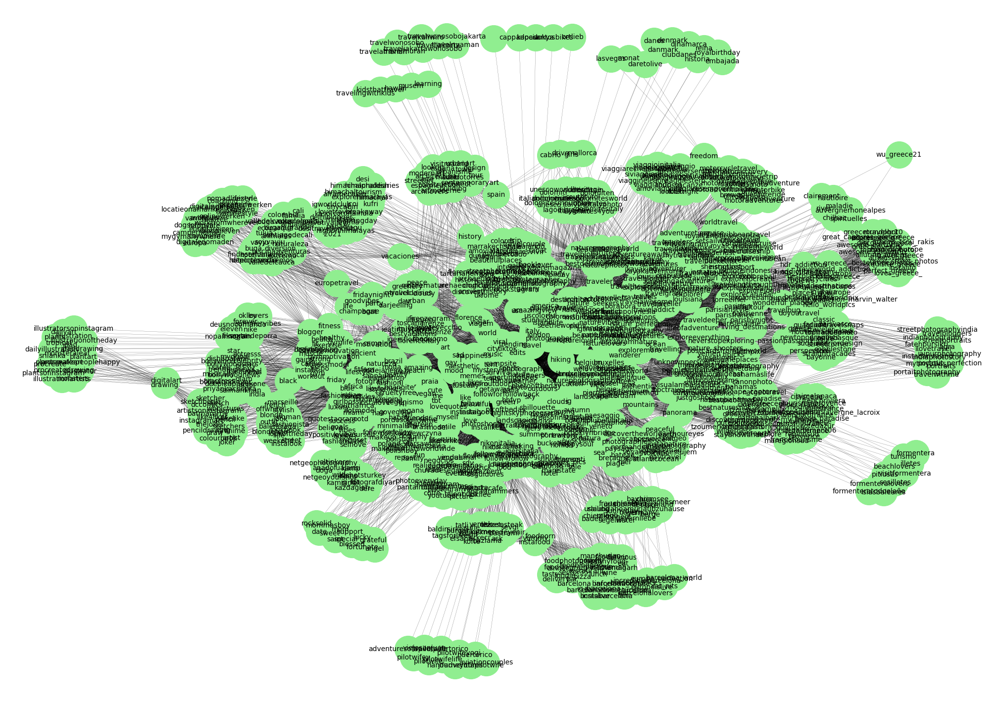

In [77]:
plt.figure(figsize=(20,14))
nx.draw(G_symmetric, pos = pos, \
    node_size=1500, node_color='lightgreen', width=0.15, \
    font_size=10, with_labels=True)
plt.show()   

# Community Plots to detect how many sub communities exist

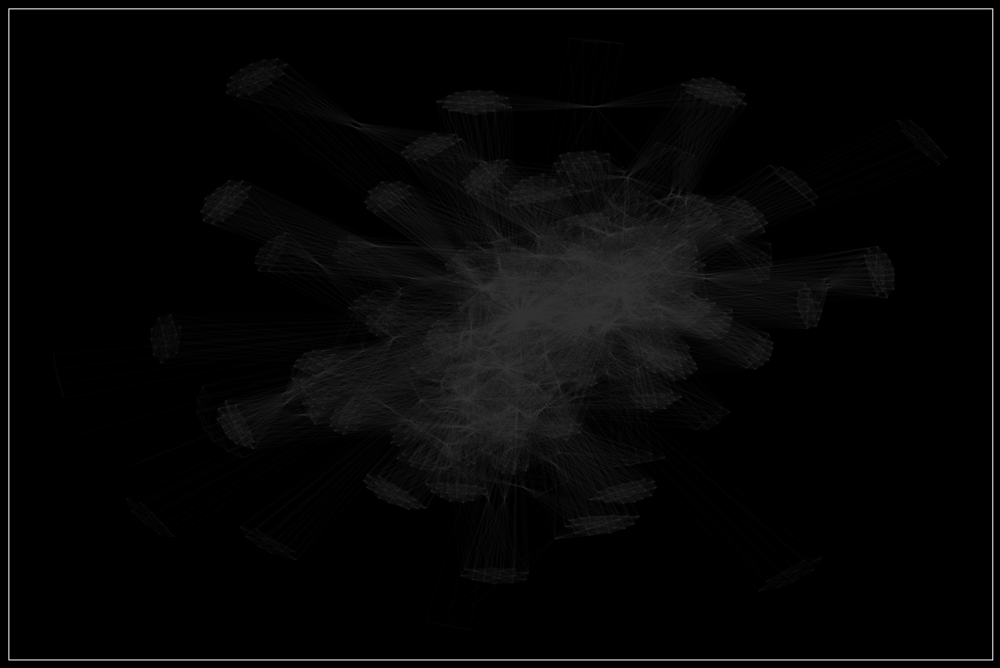

In [78]:
    pos = nx.spring_layout(G_symmetric, k=0.1)
    plt.rcParams.update({'figure.figsize': (15, 10)})
    nx.draw_networkx(
        G_symmetric, 
        pos=pos, 
        node_size=0, 
        edge_color="#444444", 
        alpha=0.05, 
        with_labels=False)

In [81]:
from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (15, 10)})
# get reproducible results
import random
from numpy import random as nprand
random.seed(123)
nprand.seed(123)

In [82]:
    def set_node_community(G_symmetric, communities):
        '''Add community to node attributes'''
        for c, v_c in enumerate(communities):
            for v in v_c:
                # Add 1 to save 0 for external edges
                G_symmetric.nodes[v]['community'] = c + 1

    def set_edge_community(G_symmetric):
        '''Find internal edges and add their community to their attributes'''
        for v, w, in G_symmetric.edges:
            if G_symmetric.nodes[v]['community'] == G_symmetric.nodes[w]['community']:
                # Internal edge, mark with community
                G_symmetric.edges[v, w]['community'] = G_symmetric.nodes[v]['community']
            else:
                # External edge, mark as 0
                G_symmetric.edges[v, w]['community'] = 0

    def get_color(i, r_off=1, g_off=1, b_off=1):
        '''Assign a color to a vertex.'''
        r0, g0, b0 = 0, 0, 0
        n = 16
        low, high = 0.1, 0.9
        span = high - low
        r = low + span * (((i + r_off) * 3) % n) / (n - 1)
        g = low + span * (((i + g_off) * 5) % n) / (n - 1)
        b = low + span * (((i + b_off) * 7) % n) / (n - 1)
        return (r, g, b)  

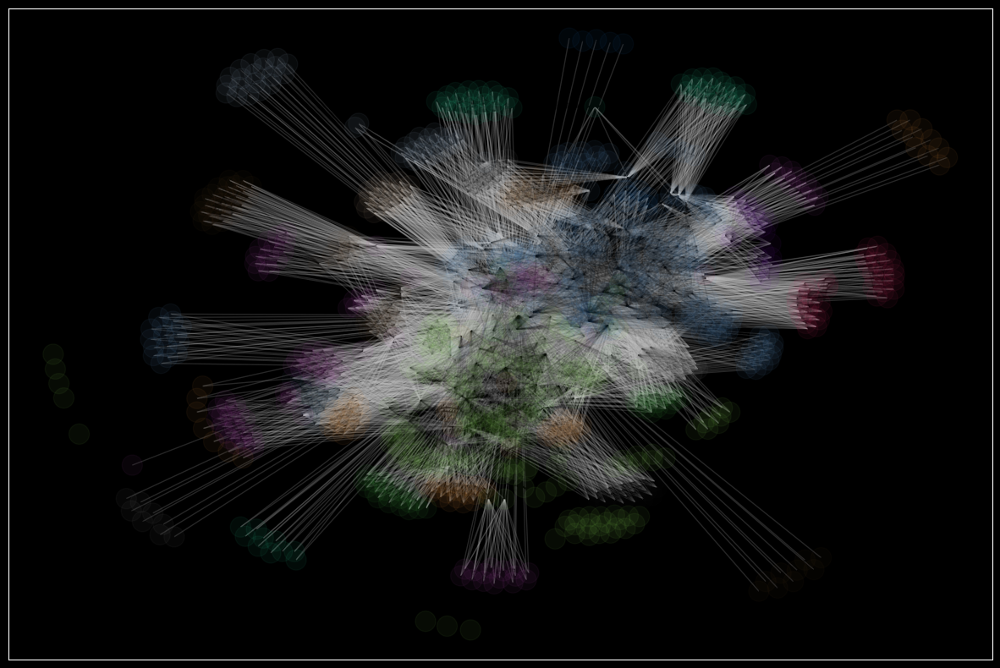

In [83]:
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (15, 10)})
plt.style.use('dark_background')

# Set node and edge communities
set_node_community(G_symmetric, communities)
set_edge_community(G_symmetric)

# Set community color for internal edges
external = [(v, w) for v, w in G_symmetric.edges if G_symmetric.edges[v, w]['community'] == 0]
internal = [(v, w) for v, w in G_symmetric.edges if G_symmetric.edges[v, w]['community'] > 0]
internal_color = ["black" for e in internal]
node_color = [get_color(G_symmetric.nodes[v]['community']) for v in G_symmetric.nodes]
# external edges
nx.draw_networkx(
        G_symmetric, 
        pos=pos, 
        node_size=0, 
        edgelist=external, 
        edge_color="silver",
        node_color=node_color,
        alpha=0.2, 
        with_labels=False)
    # internal edges
nx.draw_networkx(
        G_symmetric, pos=pos, 

        edgelist=internal, 
        edge_color=internal_color,
        node_color=node_color,
        alpha=0.05, 
        with_labels=False)

In [85]:
import igviz as ig

In [86]:
G_test = nx.Graph()

In [87]:
for key in d:
    lst=d[key].split(' ')
    l=lst[:5]
    l.append("travel")
    for i in range(len(l)):
        for j in range(len(l)):
            G_test.add_edge(l[i],l[j])

In [88]:
fig = ig.plot(G_test)
fig.show()

# From the community plot, we sort the tags that come under a community into a dictionary

In [89]:
communities = sorted(nxcom.greedy_modularity_communities(G_symmetric), key=len, reverse=True)
len(communities)

23

In [90]:
print(communities[0])

frozenset({'friday', 'believe', 'myself', 'natura', 'like4like', 'mountains', 'weekend', 'veneto', 'soleil', 'tree', 'style', 'poland', 'pics', 'followtrick', 'motivation', 'smile', 'picsart', 'sad', 'voyage', 'polskadziewczyna', 'plage', 'dog', 'seguidores', 'normandie', 'l', 'followers', 'photography', 'modafeminina', 'igersflorence', 'polska', 'likeforlike', 'picture', 'jetskycafe', 'food', 'landscaping', 'look', 'comentarios', 'southafrica', 'followme', 'landscape', 'talent', 'coffe', 'tbt', 'autumn', 'theduomo', 'bio', 'beach', 'nature', 'miami', 'l4l', 'gay', 'cute', 'flowers', 'fitness', 'blonde', 'kopi', 'summer', 'beauty', 'africa', 'sole', 'sea', 'paesaggio', 'quotestagram', 'lifestyle', 'urban', 'bhfyp', 'ig', 'ilduomo', 'fridaynight', 'tuscany', 'borghipiubelliditalia', 'blondehair', 'aesthetic', 'reais', 'cat', 'selfie', 'moda', 'me', 'riodejaneiro', 'photogram', 'selflove', 'instagram', 'offwhite', 'repost', 'follow', 'quote', 'lookoftheday', 'igersfirenze', 'evento', 'su

 # After we have the dictionary of tags, we form a dataframe with each hashtag and the community it belongs to

In [91]:
d={'tags':[],'community':[],'freq':[]}
for i in range(len(communities)):
    f=communities[i]
    for item in f:
        d['tags'].append(item)
        d['community'].append(i)

In [92]:
d

{'tags': ['friday',
  'believe',
  'myself',
  'natura',
  'like4like',
  'mountains',
  'weekend',
  'veneto',
  'soleil',
  'tree',
  'style',
  'poland',
  'pics',
  'followtrick',
  'motivation',
  'smile',
  'picsart',
  'sad',
  'voyage',
  'polskadziewczyna',
  'plage',
  'dog',
  'seguidores',
  'normandie',
  'l',
  'followers',
  'photography',
  'modafeminina',
  'igersflorence',
  'polska',
  'likeforlike',
  'picture',
  'jetskycafe',
  'food',
  'landscaping',
  'look',
  'comentarios',
  'southafrica',
  'followme',
  'landscape',
  'talent',
  'coffe',
  'tbt',
  'autumn',
  'theduomo',
  'bio',
  'beach',
  'nature',
  'miami',
  'l4l',
  'gay',
  'cute',
  'flowers',
  'fitness',
  'blonde',
  'kopi',
  'summer',
  'beauty',
  'africa',
  'sole',
  'sea',
  'paesaggio',
  'quotestagram',
  'lifestyle',
  'urban',
  'bhfyp',
  'ig',
  'ilduomo',
  'fridaynight',
  'tuscany',
  'borghipiubelliditalia',
  'blondehair',
  'aesthetic',
  'reais',
  'cat',
  'selfie',
  'mo

In [94]:
for item in d['tags']:
    try:
        d['freq'].append(freq[item])
    except:
        d['freq'].append(1)

In [95]:
d

{'tags': ['friday',
  'believe',
  'myself',
  'natura',
  'like4like',
  'mountains',
  'weekend',
  'veneto',
  'soleil',
  'tree',
  'style',
  'poland',
  'pics',
  'followtrick',
  'motivation',
  'smile',
  'picsart',
  'sad',
  'voyage',
  'polskadziewczyna',
  'plage',
  'dog',
  'seguidores',
  'normandie',
  'l',
  'followers',
  'photography',
  'modafeminina',
  'igersflorence',
  'polska',
  'likeforlike',
  'picture',
  'jetskycafe',
  'food',
  'landscaping',
  'look',
  'comentarios',
  'southafrica',
  'followme',
  'landscape',
  'talent',
  'coffe',
  'tbt',
  'autumn',
  'theduomo',
  'bio',
  'beach',
  'nature',
  'miami',
  'l4l',
  'gay',
  'cute',
  'flowers',
  'fitness',
  'blonde',
  'kopi',
  'summer',
  'beauty',
  'africa',
  'sole',
  'sea',
  'paesaggio',
  'quotestagram',
  'lifestyle',
  'urban',
  'bhfyp',
  'ig',
  'ilduomo',
  'fridaynight',
  'tuscany',
  'borghipiubelliditalia',
  'blondehair',
  'aesthetic',
  'reais',
  'cat',
  'selfie',
  'mo

In [96]:
df=pd.DataFrame(d)
df

,tags,community,freq
0,friday,0,2
1,believe,0,1
2,myself,0,1
3,natura,0,2
4,like4like,0,3
...,...,...,...
1110,travelkaliwiro,22,1
1111,travelwonosobojakarta,22,1
1112,travelmurah,22,1
1113,traveljakarta,22,1


# Sunburst plot to show community heirarchies 

In [97]:
import plotly.express as px

In [99]:
df=df[df.freq!=1]

In [100]:
fig = px.sunburst(df, path=['community','tags'], values='freq')
fig.show()